# Toolbox, packages and helper functions

In [1]:
!pip install mne==1.8.0 # installing the MNE toolbox

In [6]:
!pip install ipympl

In [2]:
import numpy as np
import pickle
import mne
import os
import ipywidgets as widgets
import matplotlib.pyplot as plt
# set size of raw browser
mne.utils.config.set_config('MNE_BROWSE_RAW_SIZE','16.0,8.0')
%matplotlib widget

In [9]:
def inspect_raw(craw,start, chan_sel,nchan=10,time_step=2,events=None):
    order = np.arange(nchan, dtype = int) + int(nchan*(chan_sel-1))
    order = order[order < len(raw.ch_names)]
    cfig = craw.plot(events = events, start = start, duration = time_step,
                     order = order,show_scrollbars = False)

def raw_interact(craw, time_step = 2, nchan = 10, events=None):
    _ = widgets.interact(inspect_raw,
                     craw = widgets.fixed(craw),
                     nchan = widgets.fixed(nchan),
                     time_step = widgets.fixed(time_step),
                     events = widgets.fixed(events),
                     start = widgets.FloatSlider(value = 0,min = 0,max = raw.times[-1], step = time_step, description = 'time'),
                     chan_sel = widgets.FloatSlider(value = 1, min = 1,step = 1, max = int(np.ceil(len(raw.ch_names)/nchan)),description = 'chan group'))


# Load data and inspect

In [3]:
#Load Google Drive folders
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
raw = mne.io.read_raw_bdf('/content/drive/MyDrive/EM3/SafRaiSir_1.bdf', preload = True) # load the raw data

Extracting EDF parameters from /content/drive/MyDrive/EM3/SafRaiSir_1.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 6559743  =      0.000 ...  3203.000 secs...


In [ ]:
raw.info

<Info | 8 non-empty values
 bads: []
 ch_names: Fp1, AF7, AF3, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C1, C3, C5, ...
 chs: 64 EEG, 1 Stimulus
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 417.0 Hz
 meas_date: 2026-04-21 09:06:24 UTC
 nchan: 65
 projs: []
 sfreq: 2048.0 Hz
 subject_info: 1 item (dict)
>

In [ ]:
print(raw.info["bads"])

[]


b) Mark Bad Channels: Use raw.info['bads'] to add the names of the identified bad channels to the bads list.

c) Interpolate Bad Channels: Use the raw.interpolate_bads() method to interpolate the data in these channels from their neighbors.

d) Plot to Verify: Plot the raw data again (raw_interact) to visually confirm if the interpolation has improved the data quality in the previously bad channels.

In [ ]:
#raw.info["bads"].extend(['PO4','P2'])

In [ ]:
#print(raw.info["bads"])

['PO4', 'P2']


In [5]:
montage = mne.channels.make_standard_montage('biosemi64')
raw.set_montage(montage)

<RawEDF | SafRaiSir_1.bdf, 65 x 6559744 (3203.0 s), ~3.18 GB, data loaded>

In [ ]:
raw_interact(raw,time_step=2,nchan=20)

interactive(children=(FloatSlider(value=0.0, description='time', max=3202.99951171875, step=2.0), FloatSlider(…

# Re-referencing (Sæt ref til average af alle channels)

In [6]:
#raw_ref = raw.copy().set_eeg_reference('average')
raw_ref = raw.copy().set_eeg_reference('average')
del raw
raw_ref.filter(1, 40)  # in-place, no copy
raw_filtered = raw_ref  # just rename the reference

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 6759 samples (3.300 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    4.7s
[Parallel(n_jobs=1)]: Done  64 out of  64 | elapsed:   19.2s finished


# Filtering

In [ ]:
#raw_filtered = raw_ref.copy().filter(1,40)
#raw_filtered = raw.copy().set_eeg_reference('average')
#raw_filtered.filter(1, 40)

# Down-sampling

In [7]:
#print(f'original sampling rate: {raw.info["sfreq"]}')
raw_ds = raw_filtered.resample(100)
#print(f'new sampling rate: {raw.info["sfreq"]}')

Trigger channel Status has a non-zero initial value of {initial_value} (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
446 events found on stim channel Status
Event IDs: [   11    40    41    42    43    44    50    51    52    53    54    60
    61    62    63    64 65536]
Trigger channel Status has a non-zero initial value of {initial_value} (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
446 events found on stim channel Status
Event IDs: [   11    40    41    42    43    44    50    51    52    53    54    60
    61    62    63    64 65536]


In [ ]:
print(raw_ds.info)
print(raw_ds.get_data())

<Info | 10 non-empty values
 bads: 2 items (PO4, P2)
 ch_names: Fp1, AF7, AF3, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C1, C3, C5, ...
 chs: 64 EEG, 1 Stimulus
 custom_ref_applied: False
 dig: 67 items (3 Cardinal, 64 EEG)
 highpass: 1.0 Hz
 lowpass: 40.0 Hz
 meas_date: 2026-04-21 09:06:24 UTC
 nchan: 65
 projs: []
 sfreq: 100.0 Hz
 subject_info: 1 item (dict)
>
[[ 1.13409233e-11  9.84622421e-07  1.31550865e-05 ... -2.28440211e-05
  -1.97849810e-05 -1.81284853e-05]
 [ 1.97369225e-11  1.40114718e-05  1.38279035e-05 ... -2.43118311e-05
  -2.66849995e-05 -2.83054745e-05]
 [ 1.80197739e-11  6.43215438e-06  1.29437032e-05 ... -1.92386624e-05
  -1.83229787e-05 -1.96166304e-05]
 ...
 [ 5.01175396e-11  1.50986539e-05  2.89915239e-05 ... -3.42481712e-06
   2.98275098e-06  9.53976421e-06]
 [-2.48345419e-11  7.44580099e-06  9.45344177e-06 ...  1.28270515e-05
   1.14535775e-05  1.64418217e-05]
 [ 6.55360000e+04  6.55360000e+04  6.55360000e+04 ...  0.00000000e+00
   0.00000000e+00  0.00000000e+00]]


In [10]:
raw_interact(raw_ds,time_step=4,nchan=64)

NameError: name 'raw' is not defined

# Events and Epoching

In [ ]:
events = mne.find_events(raw_ds)
print(events)
event_id_11=11 # Go-signal

Trigger channel Status has a non-zero initial value of {initial_value} (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
446 events found on stim channel Status
Event IDs: [   11    40    41    42    43    44    50    51    52    53    54    60
    61    62    63    64 65536]
[[   300      0  65536]
 [  1300      0  65536]
 [  5427      0     11]
 ...
 [313245      0     62]
 [313865      0     63]
 [314857      0     64]]


In [ ]:
# Chunk the data into trial-based epochs
tmin_trial = -1 # 1 second before go-signal
tmax_trial = 35.8 # longest trial (there is a lot of variation in trial duration for each phase)
#baseline = (-1,0)
epochs = mne.Epochs(raw_ds, events, event_id_11, tmin_trial, tmax_trial, baseline=None, preload=True)
print(epochs)
# Why cant we just cut it at 11 for each trial? So it knows the trial has ended when it encounters a new 11? And then cut at the time of 11 -1 ?
# Will the trials overlap? Is it fine? Can we change tmax per phase?

Not setting metadata
120 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 120 events and 3681 original time points ...
0 bad epochs dropped
<Epochs | 120 events (all good), -1 – 35.8 s (baseline off), ~219.1 MB, data loaded,
 '11': 120>


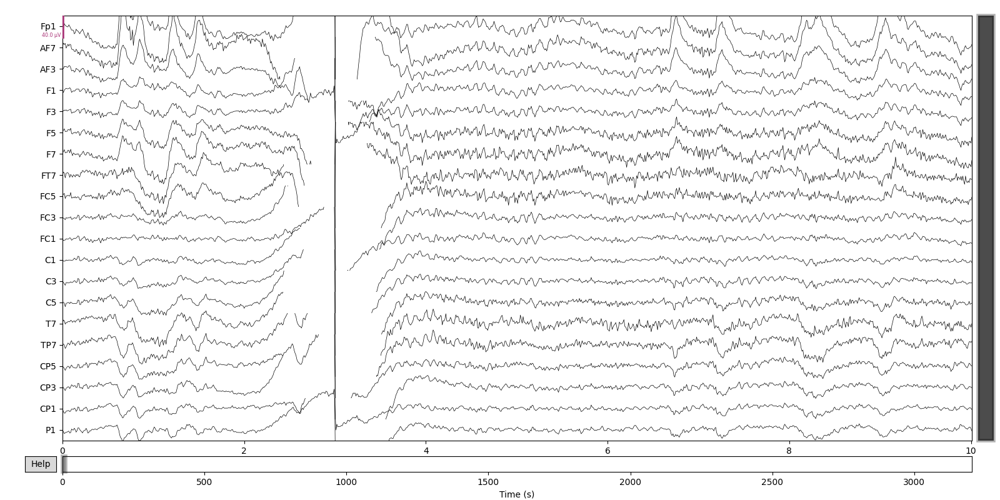

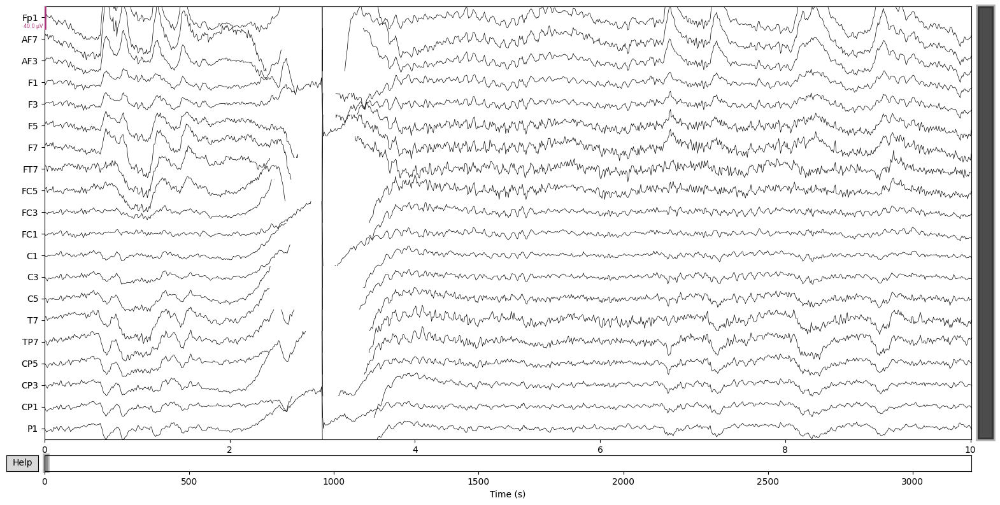

In [13]:
raw_ds.plot(block=True, order=list(range(0, 20)))


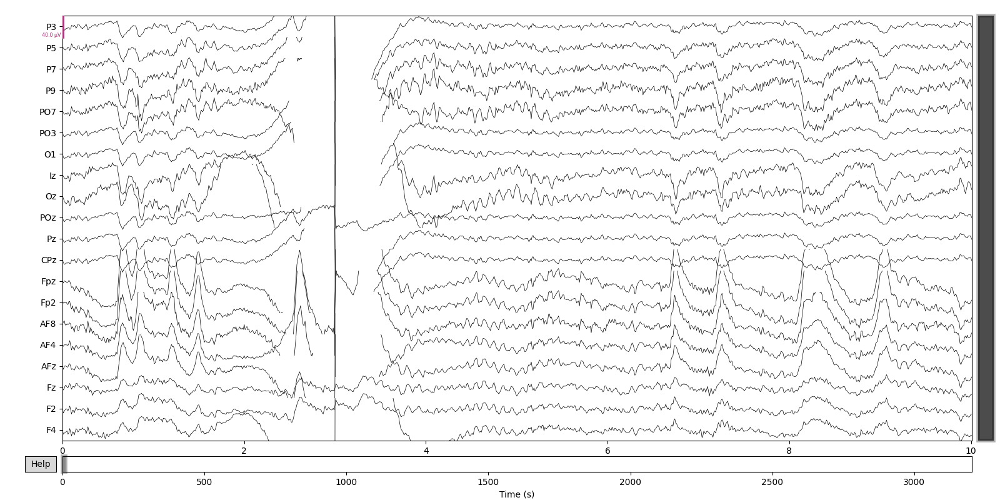

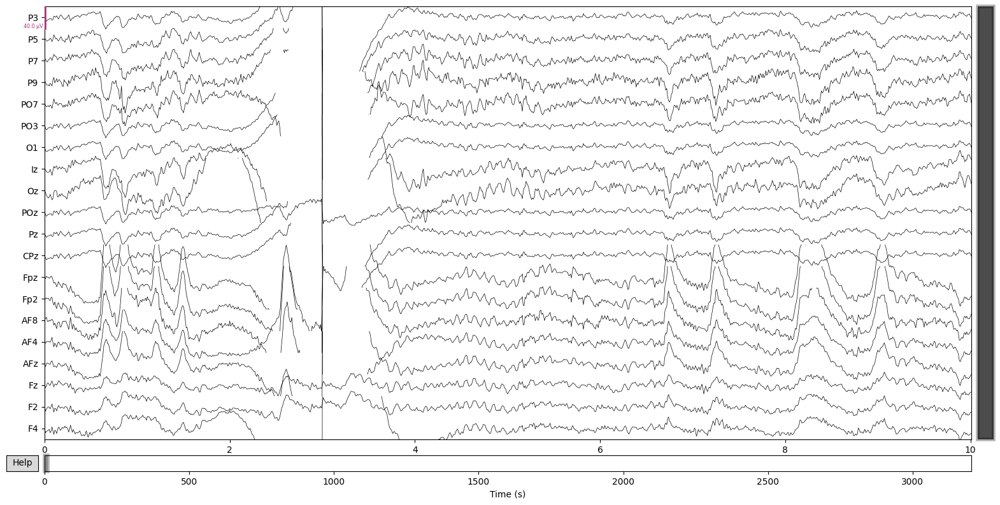

In [14]:
raw_ds.plot(block=True, order=list(range(20, 40)))

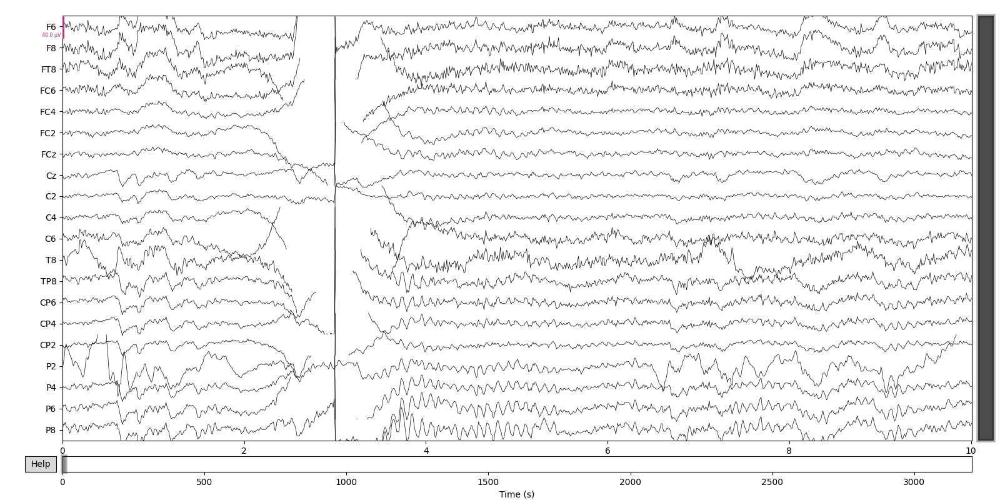

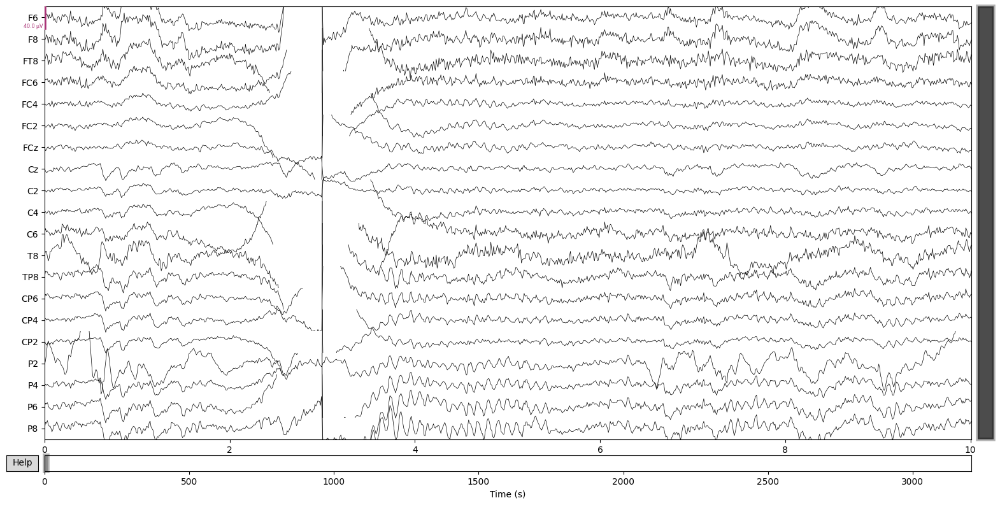

In [15]:
raw_ds.plot(block=True, order=list(range(40, 60)))

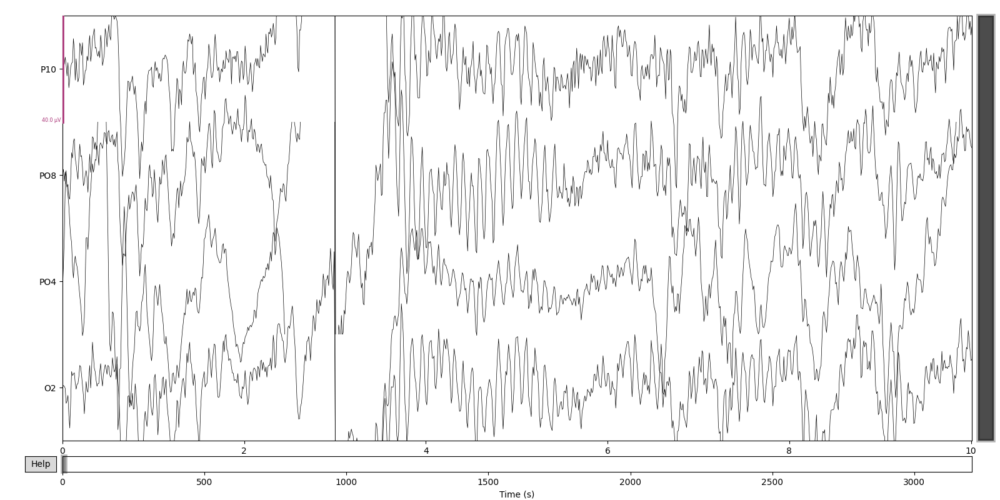

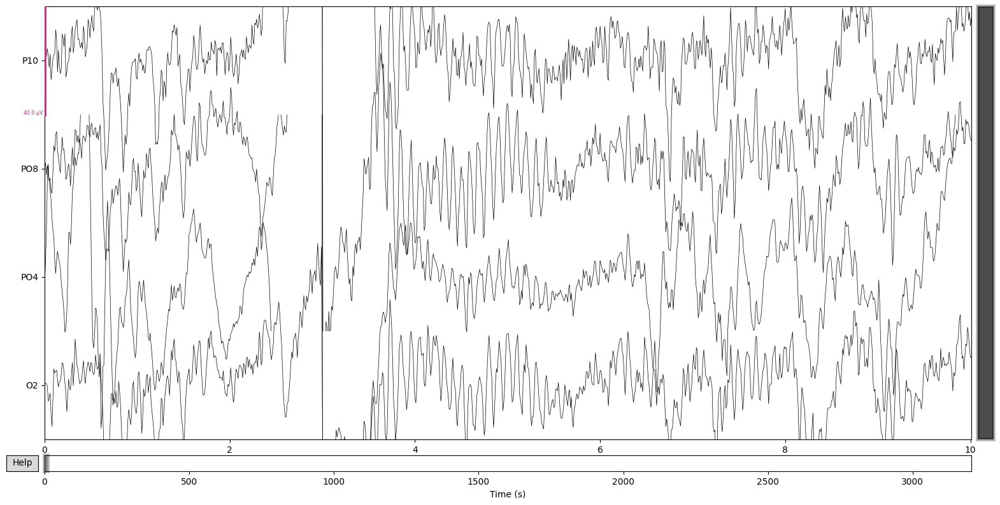

In [16]:
raw_ds.plot(block=True, order=list(range(60, 64)))

Using matplotlib as 2D backend.


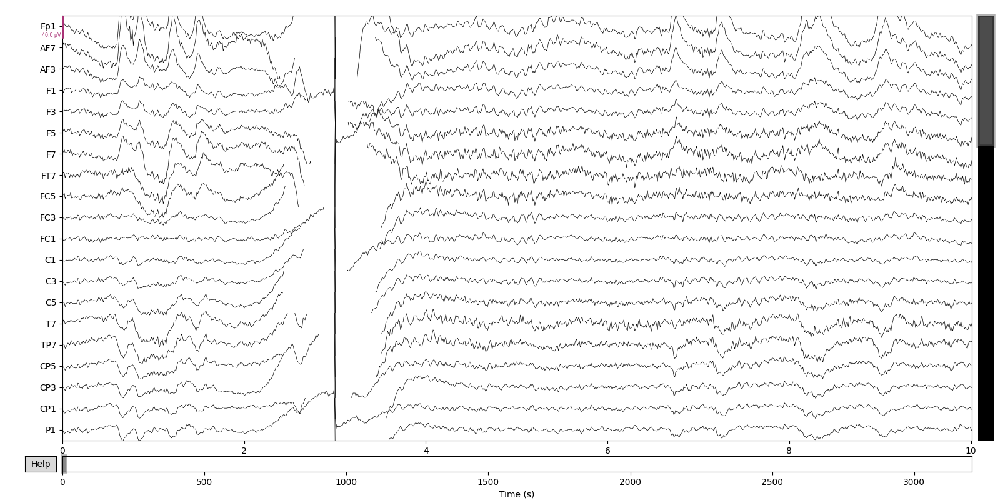

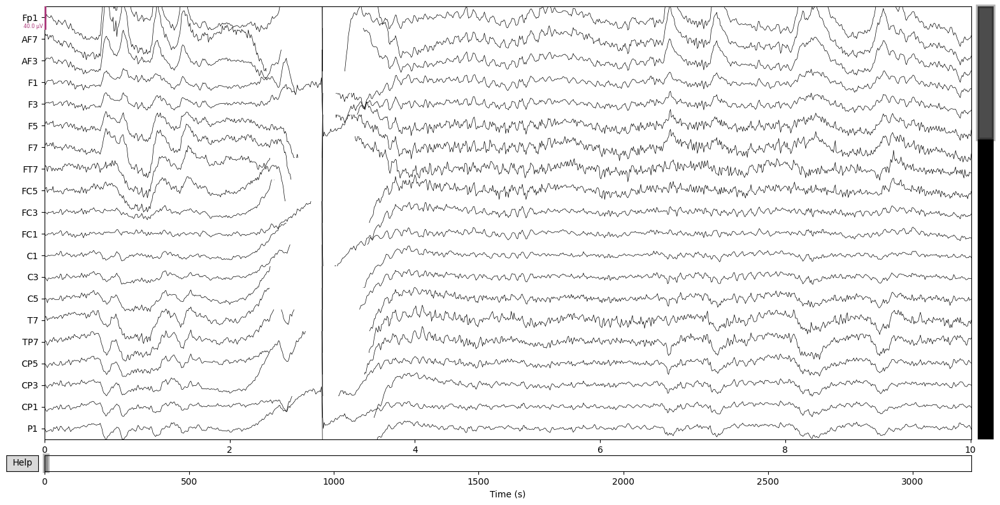

In [11]:
#Full, interactive plot — scroll function does not work
#plt.ion()
raw_ds.plot()

# ICA

In [ ]:
# ICA on long epochs
ica = mne.preprocessing.ICA()
ica.fit(epochs.pick('eeg'))

Fitting ICA to data using 64 channels (please be patient, this may take a while)
Selecting by non-zero PCA components: 63 components


/usr/local/lib/python3.12/dist-packages/sklearn/decomposition/_fastica.py:127: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(


Fitting ICA took 2493.2s.


Method,fastica
Fit parameters,algorithm=parallelfun=logcoshfun_args=Nonemax_iter=1000
Fit,1000 iterations on epochs (441720 samples)
ICA components,63
Available PCA components,64
Channel types,eeg
ICA components marked for exclusion,—


In [ ]:
# ICA on raw data (downsampled)
#ica.fit(raw_ds.pick('eeg'))
# Takes way to long:(

Fitting ICA to data using 62 channels (please be patient, this may take a while)
Selecting by non-zero PCA components: 62 components


KeyboardInterrupt: 

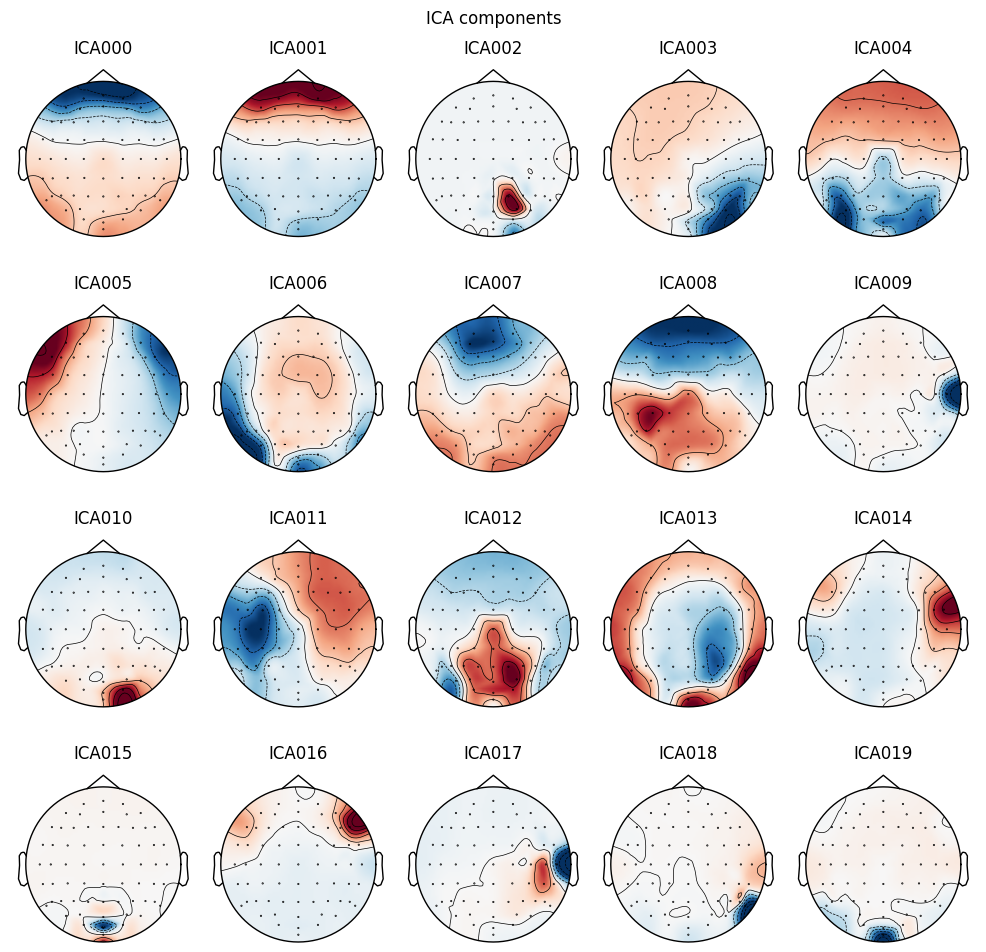

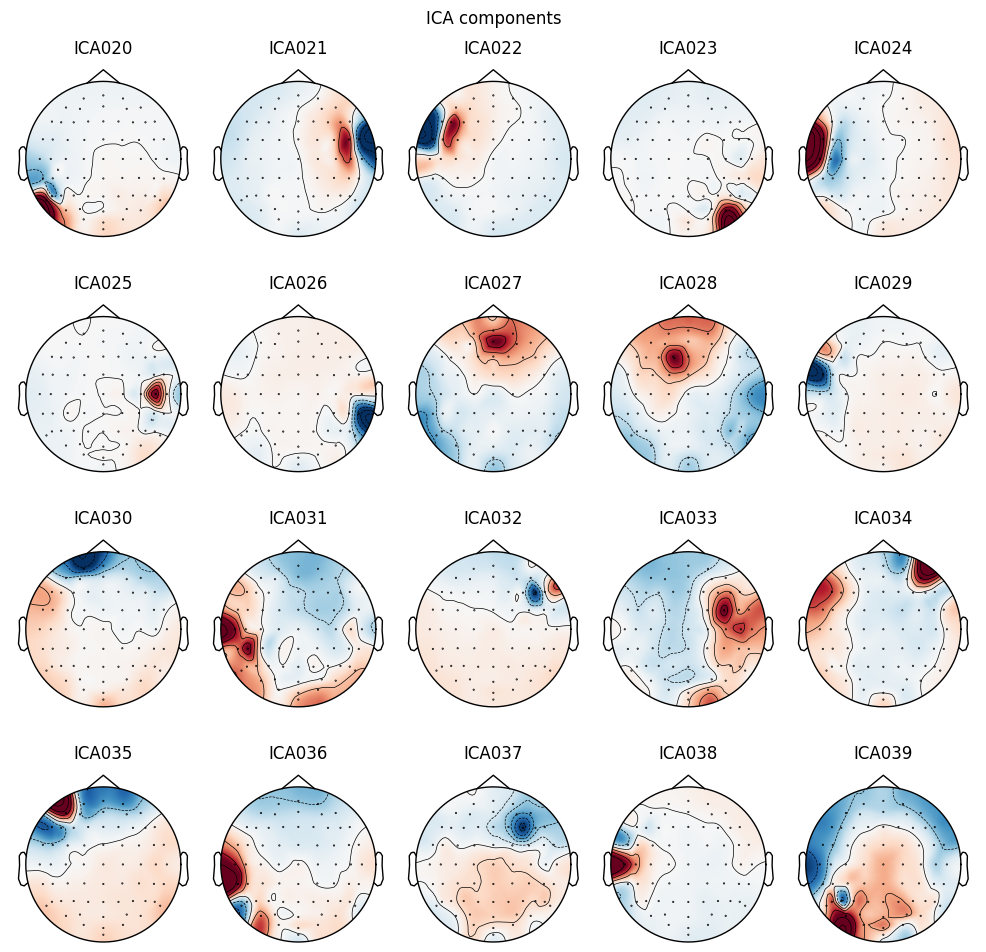

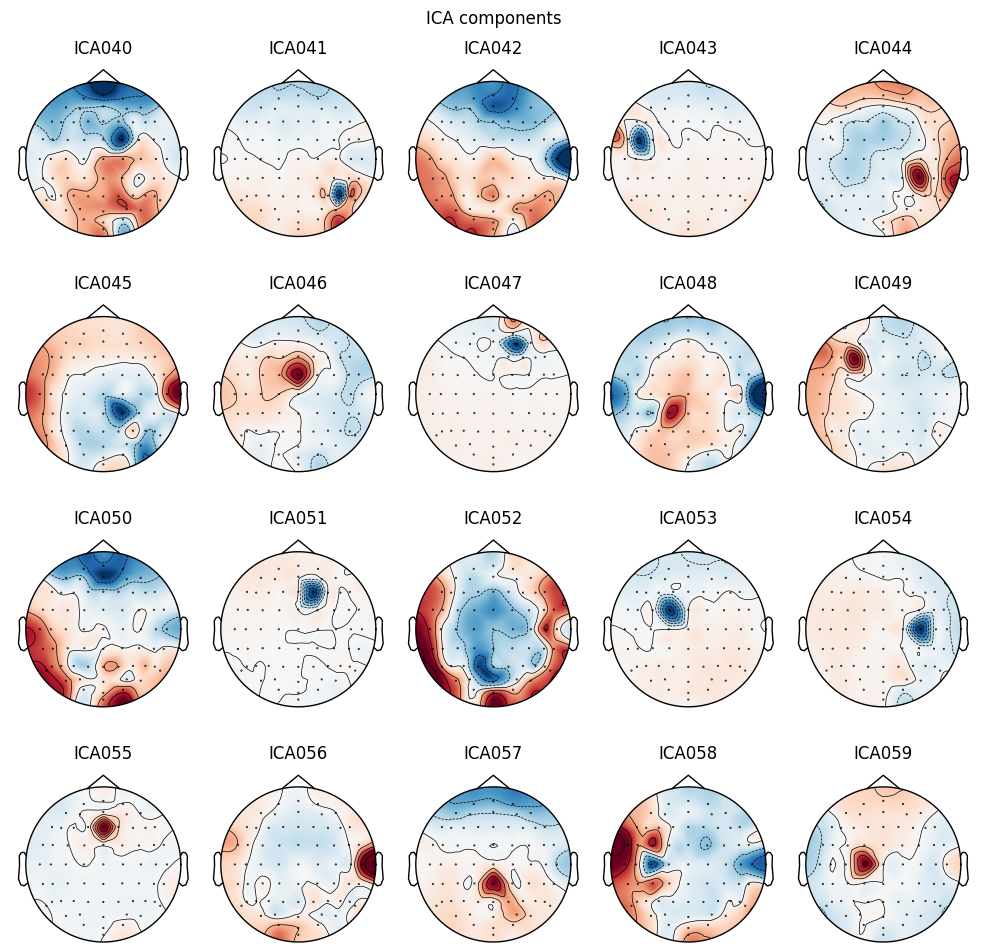

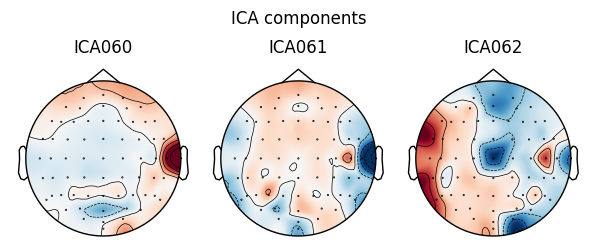

[<MNEFigure size 975x967 with 20 Axes>,
 <MNEFigure size 975x967 with 20 Axes>,
 <MNEFigure size 975x967 with 20 Axes>,
 <MNEFigure size 585x260.5 with 3 Axes>]

In [ ]:
ica.plot_components()

Not setting metadata
120 matching events found
No baseline correction applied
0 projection items activated
Using matplotlib as 2D backend.


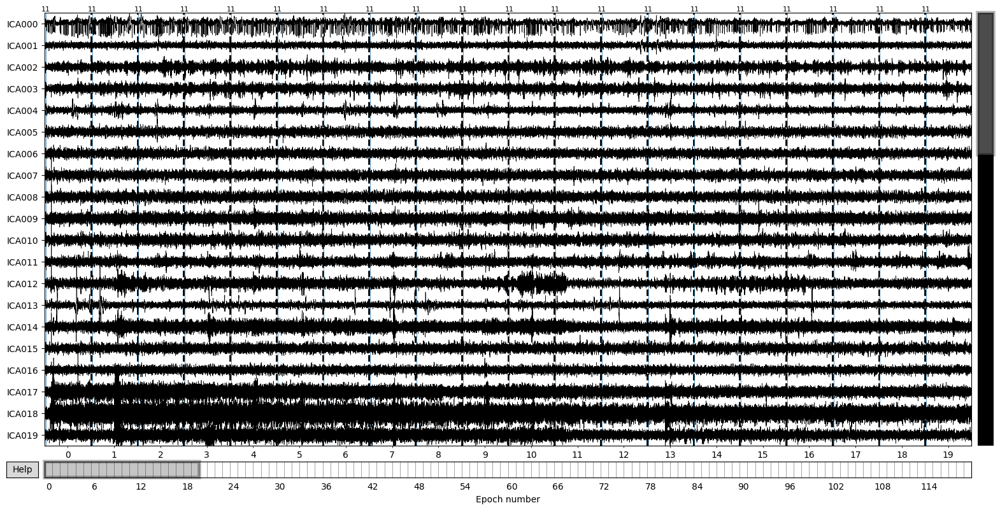

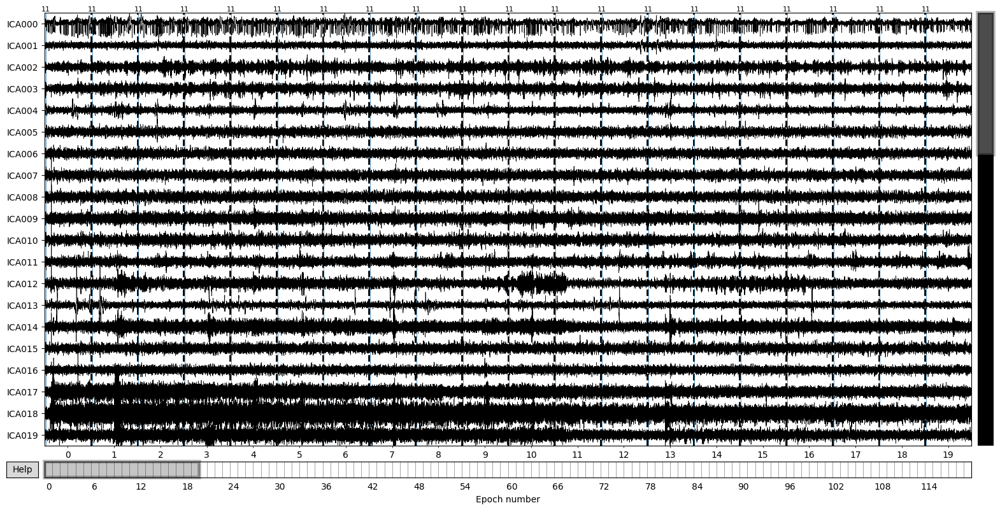

In [ ]:
ica.plot_sources(epochs)

In [ ]:
# ICA on long trial epochs
# epochs_ica = ica.apply(epochs.copy(),exclude=[0,1,4,6,8,12,13,14,16,17,18,19,20,21,22,23,27,28,29,32,36,37,41,43,46])

Applying ICA to Epochs instance
    Transforming to ICA space (61 components)
    Zeroing out 25 ICA components
    Projecting back using 64 PCA components


In [ ]:
# Load ICA soulution
ica=mne.preprocessing.read_ica('/content/drive/MyDrive/EM3/SafRaiSir_1-ica.fif')

Reading /content/drive/MyDrive/EM3/SafRaiSir_1-ica.fif ...
Now restoring ICA solution ...
Ready.


Using EOG channel: Fp1
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1000 samples (10.000 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1000 samples (10.000 s)



[Parallel(n_jobs=1)]: Done  62 out of  62 | elapsed:    1.4s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished


EOG components: [np.int64(0), np.int64(1)]


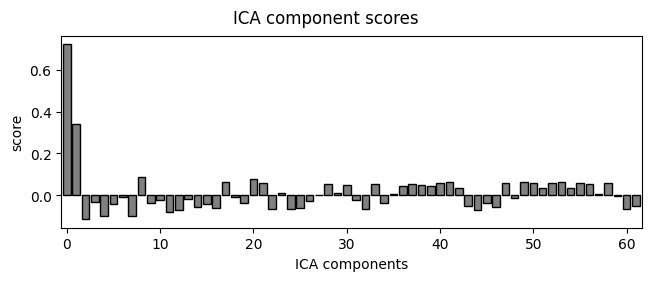

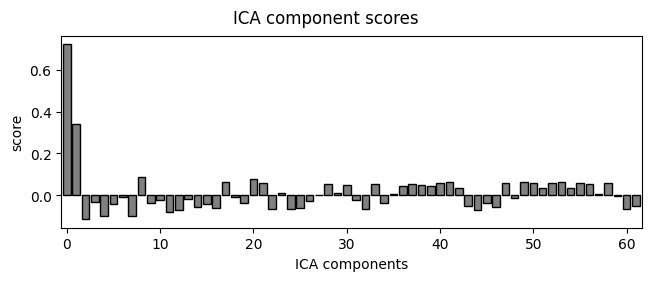

In [ ]:
# Use a frontal electrode as EOG proxy (Fp1, Fp2, or AFz are typical) — checking for eyeblinks
eog_indices, eog_scores = ica.find_bads_eog(raw_ds, ch_name='Fp1')
print('EOG components:', eog_indices)
ica.plot_scores(eog_scores)

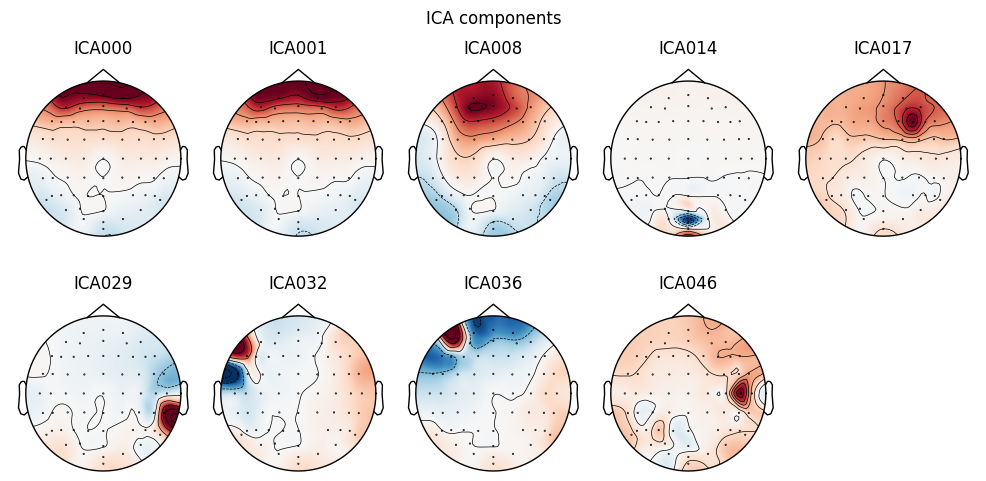

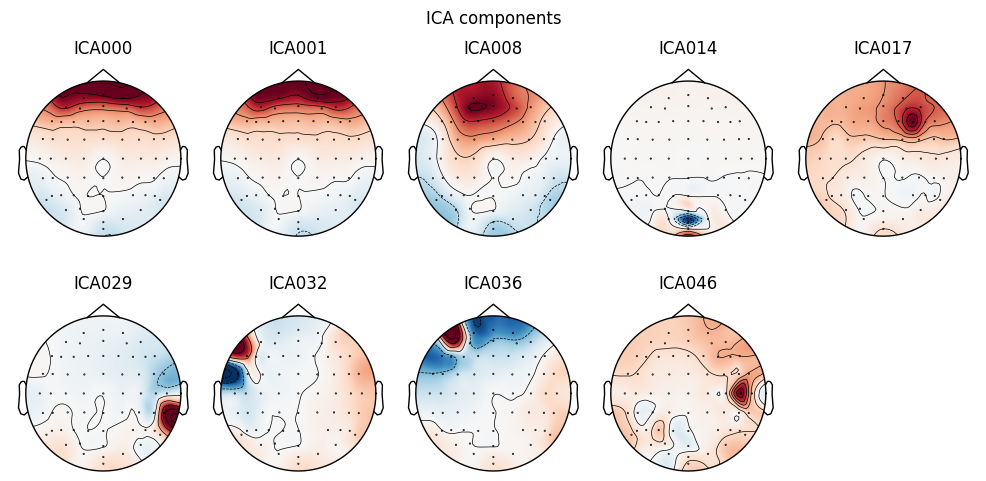

In [ ]:
# Visually inspecting all excluded components at once
ica.plot_components(picks=[0, 1, 8, 14, 17, 29, 32, 36, 46])

In [ ]:
# Check their time series
#ica.plot_sources(raw_ds, picks=[0,1,4,6,8,12,13,14,16,17,18,19,20,21,22,23,27,28,29,32,36,37,41,43,46])
ica.plot_sources(raw_ds, picks=[0, 1, 8, 14, 17, 29, 32, 36, 46])

In [ ]:
# ICA on raw data (downsampled)
#raw_ica=ica.apply(raw_ds.copy(),exclude=[0,1,4,6,8,12,13,14,16,17,18,19,20,21,22,23,27,28,29,32,36,37,41,43,46])
raw_ica = ica.apply(raw_ds.copy(), exclude=[0, 1, 8, 14, 17, 29, 32, 36, 46])

Applying ICA to Raw instance
    Transforming to ICA space (63 components)
    Zeroing out 9 ICA components
    Projecting back using 64 PCA components


In [ ]:
ica_filename = '/content/drive/MyDrive/EM3/SafRaiSir_1-ica.fif'
ica.save(ica_filename, overwrite=True)

In [ ]:
# Evt. raw_ica.interpolate_bads()

# Finding events of interest. Epoching events.

In [ ]:
# MANUAL ANNOTATION
events_stop = events.copy()
print(events_stop[5][2]) # 44 target (overshot/incorrect)
events_stop[5][2]=0 # no stop
print(events_stop[5][2])

print(events_stop[8][2]) # 43
events_stop[8][2]=1 # stop

print(events_stop[11][2]) # 43
events_stop[11][2]=1 # stop

print(events_stop[15][2]) # 43
events_stop[15][2]=1 # stop

print(events_stop[19][2]) # 43
events_stop[19][2]=1 # stop

print(events_stop[24][2]) # 44 (overshot)
events_stop[24][2]=0 # no stop


44
0
43
43
43
43
44


In [ ]:
# Changed to annotate phases (training: no-stop=20, stop=30), (transition: no-stop=21, stop=31), (test: no-stop=22, stop=32). Where 20s = no-stop and 30s = stop.
# Originally 40s = training, 50s = transition, 60s = test.
# Do we actually know if last_passed = stop for non-target stimuli also? Only if she stopped excatly at it (+-40)?

def annotate_events(events: np.ndarray, behav_csv_path: str) -> np.ndarray:
    """
    Annotate EEG events with phase-specific stop/no-stop labels.

    Parameters
    ----------
    events : np.ndarray, shape (n_events, 3)
        MNE-style events array: [sample, prev_id, event_id]
    behav_csv_path : str
        Path to the behavioural CSV file (end_pos.csv)

    Returns
    -------
    annotated : np.ndarray, shape (n_events, 3)
        Same array but with column 2 (event_id) overwritten:
          20 = no-stop training   | 30 = stop training
          21 = no-stop transition | 31 = stop transition
          22 = no-stop test       | 32 = stop test
        Trigger-11 rows are kept with their original value.
    """

    # Phase mapping: original tens digit → new phase code offset
    #   4x (training)   → offset 20
    #   5x (transition) → offset 21  (but stop uses 30+1=31, no-stop 20+1=21)
    #   6x (test)       → offset 22
    #
    # Cleaner to map tens digit → (no_stop_label, stop_label)
    PHASE_LABELS = {
        4: (20, 30),  # 40s → training
        5: (21, 31),  # 50s → transition
        6: (22, 32),  # 60s → test
    }

    # Event IDs that require a correct trial to count as stop
    CORRECTNESS_REQUIRED = {44, 54, 64}

    # ------------------------------------------------------------------
    # 1. Load behavioural data
    # ------------------------------------------------------------------
    df = pd.read_csv(behav_csv_path)
    df["correct"] = df["end_dist"] <= 40
    df["global_trial"] = range(1, len(df) + 1)

    trial_info = {
        row.global_trial: {
            "last_stimulus": int(row.last_stimulus),
            "correct": row.correct,
        }
        for row in df.itertuples()
    }

    # ------------------------------------------------------------------
    # 2. Assign global trial numbers via trigger-11 counter
    # ------------------------------------------------------------------
    n = len(events)
    trial_numbers = np.zeros(n, dtype=int)

    trial_counter = 0
    for i in range(n):
        if events[i, 2] == 11:
            trial_counter += 1
        trial_numbers[i] = trial_counter

    # ------------------------------------------------------------------
    # 3. Build annotated array
    # ------------------------------------------------------------------
    annotated = events.copy()

    for i in range(n):
        event_id = int(events[i, 2])

        # Keep trial-start markers unchanged
        if event_id == 11:
            continue

        tens = event_id // 10  # 4, 5, or 6

        # Events outside the 40–69 range are left unchanged
        if tens not in PHASE_LABELS:
            continue

        no_stop_label, stop_label = PHASE_LABELS[tens]

        trial_no = trial_numbers[i]

        # Events before first trigger-11 or with no CSV row → no-stop
        if trial_no == 0 or trial_no not in trial_info:
            annotated[i, 2] = no_stop_label
            continue

        info = trial_info[trial_no]
        is_last_stimulus = event_id == info["last_stimulus"]

        if not is_last_stimulus:
            annotated[i, 2] = no_stop_label
        elif event_id in CORRECTNESS_REQUIRED:
            annotated[i, 2] = stop_label if info["correct"] else no_stop_label
        else:
            annotated[i, 2] = stop_label

    return annotated


In [ ]:
import pandas as pd
events2=annotate_events(events,'/content/drive/MyDrive/EM3/end_pos.csv')
print(events2)
# "Remove" first two events/rows (no need)
#events2[0][2]=99
#events2[1][2]=99

[[   300      0  65536]
 [  1300      0  65536]
 [  5427      0     11]
 ...
 [313245      0     22]
 [313865      0     22]
 [314857      0     32]]


In [ ]:
# Create dictionary of manually annotated events (stop vs. non-stop events)
event_id = {'no_stop_training': [20], 'no_stop_transition':[21], 'no_stop_test':[22], 'stop_training':[30], 'stop_transition':[31], 'stop_test':[32]}

In [ ]:
tmin = -.1 # 0.1 second before event
tmax = .6
baseline = (-.1,0)

# NO STOP TRAINING
epochs_no_stop_training = mne.Epochs(raw_ica, events2, event_id['no_stop_training'], tmin, tmax, baseline, preload=True)
print(epochs_no_stop_training)

Not setting metadata
94 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 94 events and 71 original time points ...
0 bad epochs dropped
<Epochs | 94 events (all good), -0.1 – 0.6 s (baseline -0.1 – 0 s), ~3.4 MB, data loaded,
 '20': 94>


In [ ]:
# NO STOP TRANSITION
epochs_no_stop_transition = mne.Epochs(raw_ica, events2, event_id['no_stop_transition'], tmin, tmax, baseline, preload=True)
print(epochs_no_stop_transition)

Not setting metadata
61 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 61 events and 71 original time points ...
0 bad epochs dropped
<Epochs | 61 events (all good), -0.1 – 0.6 s (baseline -0.1 – 0 s), ~2.2 MB, data loaded,
 '21': 61>


In [ ]:
# NO STOP TEST
epochs_no_stop_test = mne.Epochs(raw_ica, events2, event_id['no_stop_test'], tmin, tmax, baseline, preload=True)
print(epochs_no_stop_transition)

Not setting metadata
60 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 60 events and 71 original time points ...
0 bad epochs dropped
<Epochs | 61 events (all good), -0.1 – 0.6 s (baseline -0.1 – 0 s), ~2.2 MB, data loaded,
 '21': 61>


In [ ]:
# STOP TRAINING
epochs_stop_training = mne.Epochs(raw_ica, events2, event_id['stop_training'], tmin, tmax, baseline, preload=True)
print(epochs_stop_training)

Not setting metadata
40 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 40 events and 71 original time points ...
0 bad epochs dropped
<Epochs | 40 events (all good), -0.1 – 0.6 s (baseline -0.1 – 0 s), ~1.5 MB, data loaded,
 '30': 40>


In [ ]:
# STOP TRANSITION
epochs_stop_transition = mne.Epochs(raw_ica, events2, event_id['stop_transition'], tmin, tmax, baseline, preload=True)
print(epochs_stop_transition)

Not setting metadata
40 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 40 events and 71 original time points ...
0 bad epochs dropped
<Epochs | 40 events (all good), -0.1 – 0.6 s (baseline -0.1 – 0 s), ~1.5 MB, data loaded,
 '31': 40>


In [ ]:
# STOP TEST
epochs_stop_test = mne.Epochs(raw_ica, events2, event_id['stop_test'], tmin, tmax, baseline, preload=True)
print(epochs_stop_test)

Not setting metadata
29 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 29 events and 71 original time points ...
0 bad epochs dropped
<Epochs | 29 events (all good), -0.1 – 0.6 s (baseline -0.1 – 0 s), ~1.1 MB, data loaded,
 '32': 29>


In [ ]:
# TARGET TRAINING
epochs_target_training = mne.Epochs(raw_ica, events, 44, tmin, tmax, baseline, preload=True)
print(epochs_target_training)

Not setting metadata
35 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 35 events and 71 original time points ...
0 bad epochs dropped
<Epochs | 35 events (all good), -0.1 – 0.6 s (baseline -0.1 – 0 s), ~1.3 MB, data loaded,
 '44': 35>


In [ ]:
# TARGET TRANSITION
epochs_target_transition = mne.Epochs(raw_ica, events, 54, tmin, tmax, baseline, preload=True)
print(epochs_target_transition)

Not setting metadata
22 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 22 events and 71 original time points ...
0 bad epochs dropped
<Epochs | 22 events (all good), -0.1 – 0.6 s (baseline -0.1 – 0 s), ~870 kB, data loaded,
 '54': 22>


In [ ]:
# TARGET TEST
epochs_target_test = mne.Epochs(raw_ica, events, 64, tmin, tmax, baseline, preload=True)
print(epochs_target_test)

Not setting metadata
27 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 27 events and 71 original time points ...
0 bad epochs dropped
<Epochs | 27 events (all good), -0.1 – 0.6 s (baseline -0.1 – 0 s), ~1.0 MB, data loaded,
 '64': 27>


(61, 65, 71)
<Evoked | '21' (average, N=61), -0.1 – 0.6 s, baseline -0.1 – 0 s, 64 ch, ~111 kB>


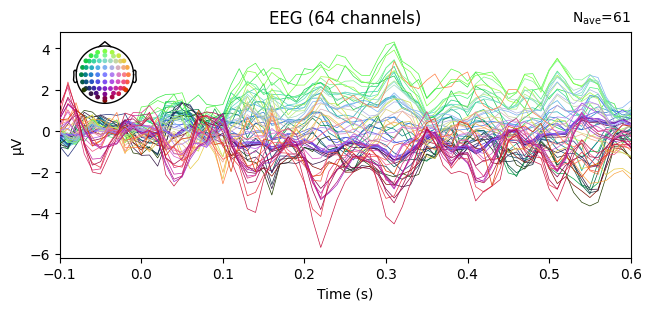

Figure(640x300)
61
(60, 65, 71)
<Evoked | '22' (average, N=60), -0.1 – 0.6 s, baseline -0.1 – 0 s, 64 ch, ~111 kB>


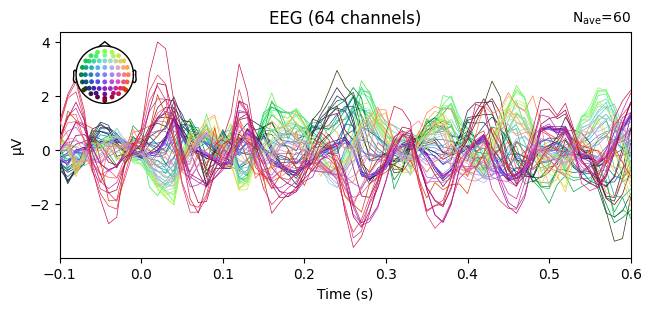

Figure(640x300)
60


In [ ]:
# Inspect the epochs
print(epochs_no_stop_transition.get_data().shape) # (x, y, z): antal events, antal channels, n timepoints i interval på q sekunder.
print(epochs_no_stop_transition.average())
print(epochs_no_stop_transition.average().plot())
print(epochs_no_stop_transition.__len__()) # antal epochs = antal events

print(epochs_no_stop_test.get_data().shape) # (x, y, z): antal events, antal channels, n timepoints i interval på q sekunder.
print(epochs_no_stop_test.average())
print(epochs_no_stop_test.average().plot())
print(epochs_no_stop_test.__len__()) # antal epochs = antal events

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


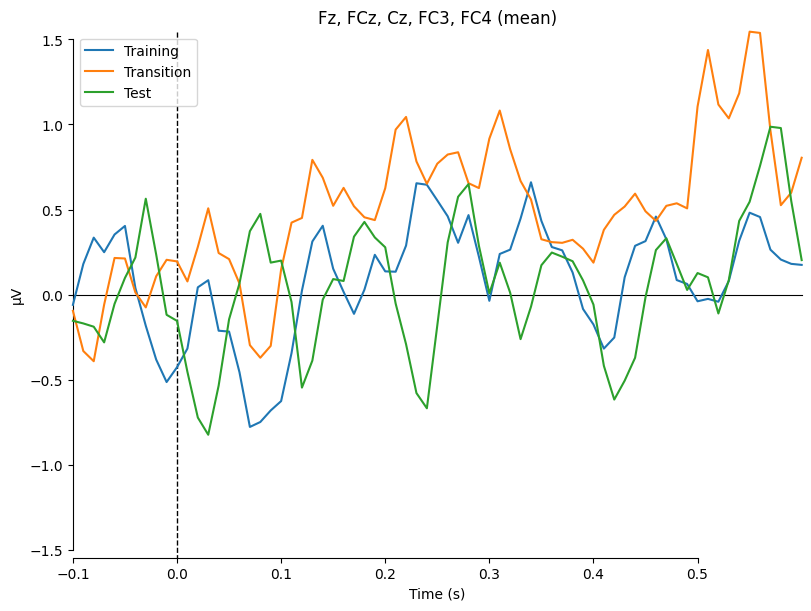

NameError: name 'epochs_stop_training' is not defined

In [ ]:
# COMPARE NO-STOP TRAINING, TRANSITION AND TEST (N1 supression, frontal negativity or left lateral sensori-motor signal)
ERP_no_stop_train = epochs_no_stop_training.average()
ERP_no_stop_trans = epochs_no_stop_transition.average()
ERP_no_stop_test = epochs_no_stop_test.average()
evokeds = {
    'Training': ERP_no_stop_train,
    'Transition': ERP_no_stop_trans,
    'Test': ERP_no_stop_test
}

mne.viz.plot_compare_evokeds(evokeds, picks=['Fz', 'FCz', 'Cz', 'FC3', 'FC4'], combine='mean')

# COMPARE STOP TRAINING, TRANSITION AND TEST
ERP_stop_train = epochs_stop_training.average()
ERP_stop_trans = epochs_stop_transition.average()
ERP_stop_test = epochs_stop_test.average()
mne.viz.plot_compare_evokeds([ERP_stop_train,ERP_stop_trans,ERP_stop_test],picks=['Fz', 'FCz', 'Cz', 'FC3', 'FC4'],combine='mean')

# Very noisy signals
# Very small "ERPs" compared to what we see in OpenScience data
# The peaks are shifted - latency?

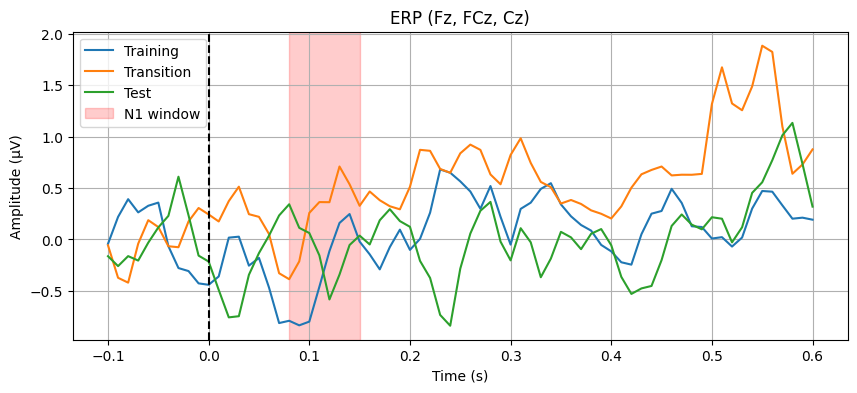

In [ ]:
# Get the data from your ERPs
train_data = ERP_no_stop_train.get_data(picks=['Fz', 'FCz', 'Cz']).mean(axis=0) * 1e6  # convert to µV
trans_data = ERP_no_stop_trans.get_data(picks=['Fz', 'FCz', 'Cz']).mean(axis=0) * 1e6
test_data = ERP_no_stop_test.get_data(picks=['Fz', 'FCz', 'Cz']).mean(axis=0) * 1e6

times = ERP_no_stop_train.times

plt.figure(figsize=(10, 4))
plt.plot(times, train_data, label='Training')
plt.plot(times, trans_data, label='Transition')
plt.plot(times, test_data, label='Test')
plt.axvline(0, color='k', linestyle='--')
plt.axvspan(0.08, 0.15, alpha=0.2, color='red', label='N1 window')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.title('ERP (Fz, FCz, Cz)')
plt.legend()
plt.grid(True)

combining channels using "mean"
combining channels using "mean"


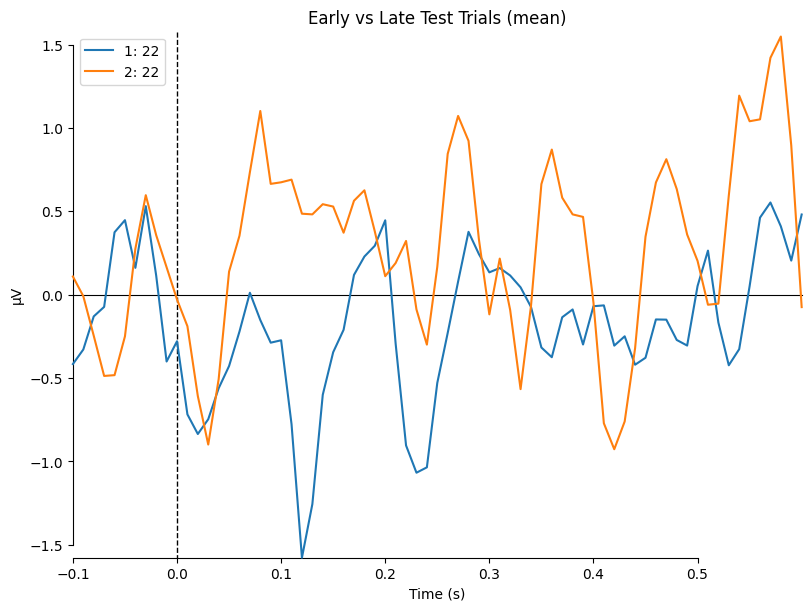

[<Figure size 800x600 with 1 Axes>]

In [ ]:
# COMPARE EARLY AND LATE TRIALS IN TEST (AS-ONLY) TO LOOK FOR N1 SUPRESSION
# Get the total number of test trials
n_test_trials = len(epochs_no_stop_test)
midpoint = n_test_trials // 2

# Split into early and late
epochs_early_test = epochs_no_stop_test[:midpoint]
epochs_late_test = epochs_no_stop_test[midpoint:]

# Average and plot
ERP_early = epochs_early_test.average()
ERP_late = epochs_late_test.average()

mne.viz.plot_compare_evokeds(
    [ERP_early, ERP_late],
    picks=['Fz', 'FCz', 'Cz', 'FC3', 'FC4'], combine='mean',
    title='Early vs Late Test Trials'
)

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


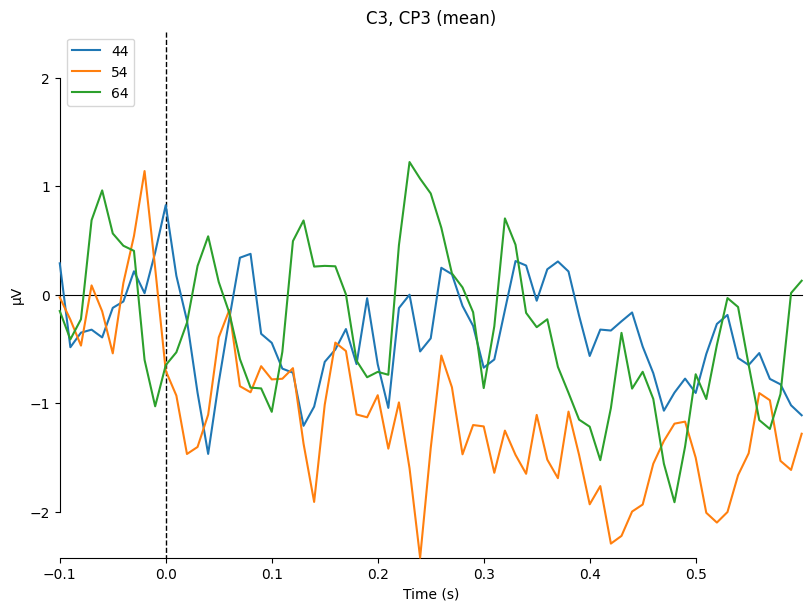

[<Figure size 800x600 with 1 Axes>]

In [ ]:
# Compare signal at target for training, transition and test
# Sensori-motor signal (left laterization because of right hand): ['C3', 'CP3']
# Auditory signal: ['Fz', 'FCz', 'Cz', 'FC3', 'FC4']
ERP_target_train = epochs_target_training.average()
ERP_target_trans = epochs_target_transition.average()
ERP_target_test = epochs_target_test.average()
mne.viz.plot_compare_evokeds([ERP_target_train,ERP_target_trans,ERP_target_test],picks=['C3', 'CP3'], combine='mean')

# Statistics

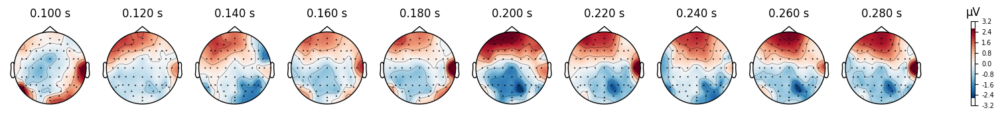

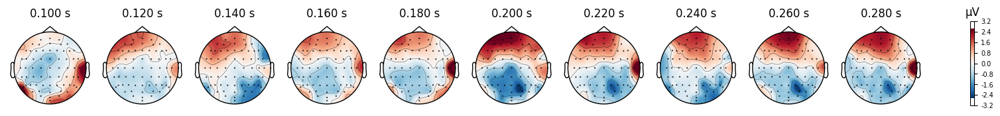

In [ ]:
ERP_no_stop_train.plot_topomap(times=np.arange(0.1,.3,.02))

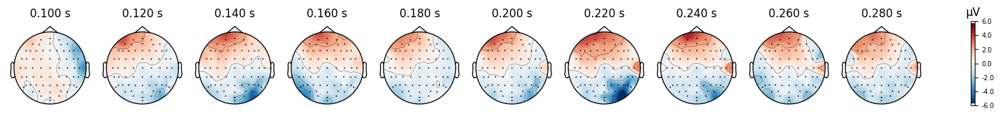

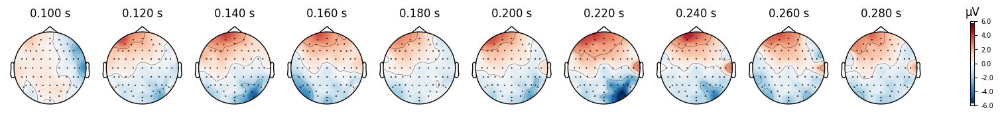

In [ ]:
ERP_no_stop_trans.plot_topomap(times=np.arange(0.1,.3,.02))

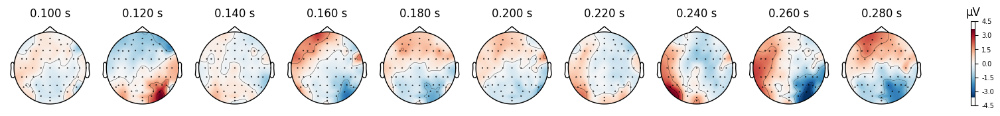

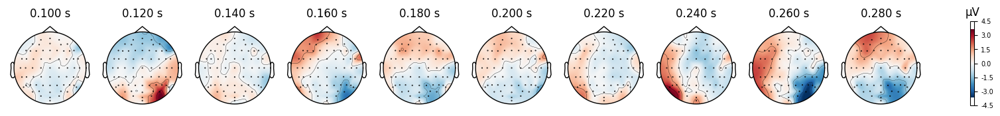

In [ ]:
ERP_no_stop_test.plot_topomap(times=np.arange(0.1,.3,.02))

In [ ]:
from scipy.stats import ttest_ind

tvals, pvals = ttest_ind(epochs_no_stop_training.get_data(),epochs_no_stop_transition.get_data())
print(pvals.shape)

pmask = pvals <= .05
print(pmask)

(65, 71)
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]


In [ ]:
_, qvals = mne.stats.fdr_correction(pvals)
qmask = qvals <= .05
print(qmask)

[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]


In [ ]:
# Cluster-based permutation test
import numpy as np
from mne.stats import permutation_cluster_1samp_test
import scipy.stats

# Pick only EEG channels
epochs_transition_eeg = epochs_no_stop_transition.copy().pick_types(eeg=True)
epochs_test_eeg = epochs_no_stop_test.copy().pick_types(eeg=True)

# Compute adjacency from EEG-only epochs
adjacency, ch_names_adj = mne.channels.find_ch_adjacency(
    epochs_transition_eeg.info, ch_type='eeg'
)
print(f"Adjacency shape: {adjacency.shape}")
print(f"N channels: {len(epochs_transition_eeg.ch_names)}")

# Compute X_input from EEG-only epochs
X_transition = epochs_transition_eeg.get_data()
X_test = epochs_test_eeg.get_data()

n_trials = min(len(X_transition), len(X_test))
X_input = X_transition[:n_trials] - X_test[:n_trials]

# Transpose to (n_trials, n_timepoints, n_channels)
X_input_T = X_input.transpose(0, 2, 1)

t_thresh = scipy.stats.t.ppf(1 - 0.05/2, df=n_trials - 1)

# Run test
T_obs, clusters, p_values, _ = permutation_cluster_1samp_test(
    X_input_T,
    threshold=t_thresh,
    n_permutations=1024,
    tail=0,
    adjacency=adjacency,
    n_jobs=1,
    seed=42
)

print(f"Number of clusters: {len(clusters)}")
print(f"Cluster p-values: {p_values}")

NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Could not find a adjacency matrix for the data. Computing adjacency based on Delaunay triangulations.
-- number of adjacent vertices : 64
Adjacency shape: (64, 64)
N channels: 64
stat_fun(H1): min=-3.805982474363836 max=3.779128675451499
Running initial clustering …
Found 31 clusters


  0%|          | Permuting : 0/1023 [00:00<?,       ?it/s]

Number of clusters: 31
Cluster p-values: [1.         0.25683594 0.9921875  0.32421875 1.         1.
 0.0703125  0.16699219 1.         0.48339844 0.49804688 0.984375
 1.         1.         1.         0.49902344 1.         0.97363281
 0.73339844 0.9921875  1.         0.09472656 1.         0.63574219
 0.99902344 0.86914062 0.99804688 1.         1.         0.87792969
 0.98925781]


In [ ]:
# Find the most significant cluster
best_cluster_idx = np.argmin(p_values)
best_cluster = clusters[best_cluster_idx]

# Get the channel and timepoint indices
cluster_timepoints, cluster_channels = best_cluster

# Get channel names
sig_channels = [epochs_transition_eeg.ch_names[i] for i in np.unique(cluster_channels)]
sig_times = epochs_transition_eeg.times[np.unique(cluster_timepoints)]

print(f"Most significant cluster (p = {p_values[best_cluster_idx]:.3f})")
print(f"Channels: {sig_channels}")
print(f"Time range: {sig_times[0]*1000:.0f}ms to {sig_times[-1]*1000:.0f}ms")

Most significant cluster (p = 0.070)
Channels: ['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'FC1', 'C1', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'FC4', 'FC2', 'FCz', 'C2']
Time range: 210ms to 260ms


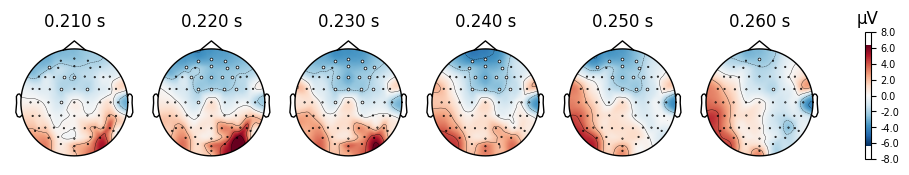

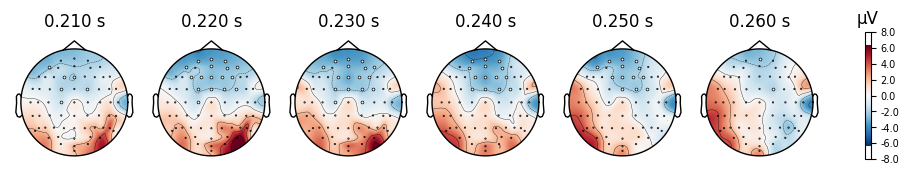

In [ ]:
# Create a mask for the best cluster
cluster_mask = np.zeros(T_obs.shape, dtype=bool)
cluster_mask[best_cluster] = True

# Plot T-values with cluster mask
evoked_diff = mne.combine_evoked([ERP_no_stop_trans, ERP_no_stop_test], weights=[-1, 1])
evoked_diff.plot_topomap(times=sig_times, mask=cluster_mask.T)

In [ ]:
print(X_input.shape)
print(f"Transition trials: {len(X_transition)}")
print(f"Test trials: {len(X_test)}")
print(f"n_trials: {n_trials}")
epochs_transition_eeg.info['sfreq']


(60, 64, 71)
Transition trials: 61
Test trials: 60
n_trials: 60


100.0

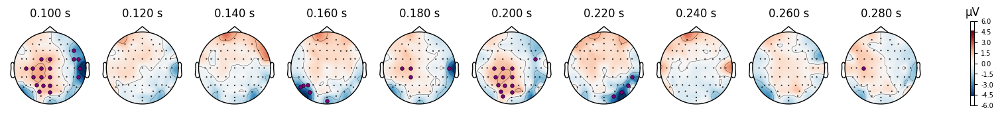

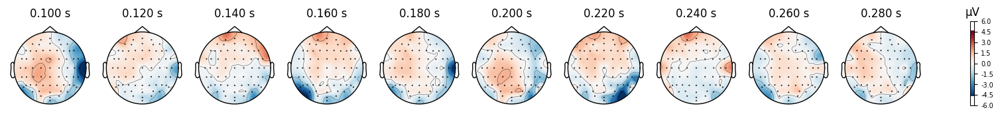

In [ ]:
# difference = test - transition
mask_params = dict(marker='o', markerfacecolor='purple', markeredgecolor='black',
                   linewidth=0, markersize=8)

fig = mne.combine_evoked([ERP_no_stop_train, ERP_no_stop_trans],
                          weights=[-1,1]).plot_topomap(
                              times=np.arange(0.1, .3, .02),
                              show=False,
                              mask=pmask,
                              mask_params=mask_params)

# Multiple comparisons correction
fig = mne.combine_evoked([ERP_no_stop_train, ERP_no_stop_trans],
                          weights=[-1,1]).plot_topomap(
                              times=np.arange(0.1, .3, .02),
                              show=False,
                              mask=qmask,
                              mask_params=mask_params)
# More frontal negativity in test compared to transition around 120-140ms and around 220-240ms
# Clearer auditory signal in test? More attentuation to the auditory signal in test-phase?
# Early P2 in transition (and training)?
# The signals are different in training/transition (both modalities) and test (auditory only)
# But is the wave around 120-140ms actually N2? Do we look more at the timing of the ERP or if its the first/second wave?

[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]


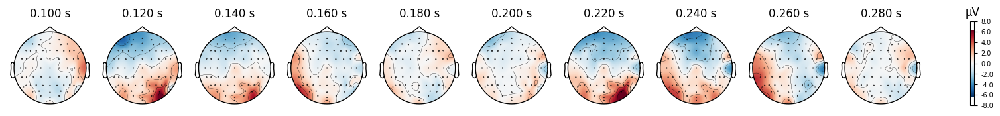

## Training events

Difference

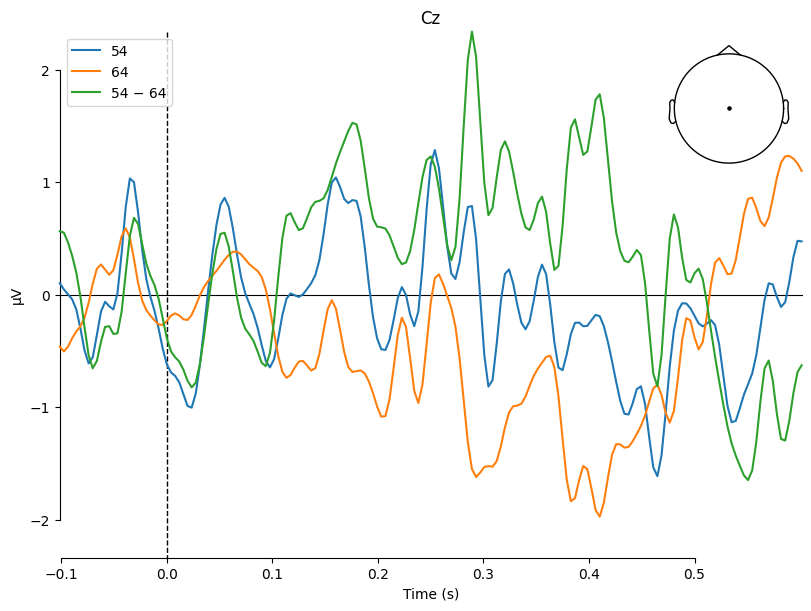

[<Figure size 800x600 with 2 Axes>]

In [ ]:
mne.viz.plot_compare_evokeds([ERP_54,ERP_64, mne.combine_evoked([ERP_54,ERP_64], weights=[1,-1])],picks=['Cz'])



Analysis using cluster based appraches

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

import mne
from mne.datasets import sample
from mne.stats import permutation_cluster_test

print(__doc__)